# 📊 02 - Exploratory Data Analysis (EDA)
This notebook performs EDA on the final merged energy dataset.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Load the dataset
file_path = '../data/processed/merged_energy_data_final_step_1.csv'
df = pd.read_csv(file_path, parse_dates=['utc_timestamp'])
df.set_index('utc_timestamp', inplace=True)
df.head()

,cet_cest_timestamp,DE_load_actual_entsoe_transparency,DE_solar_capacity,DE_solar_generation_actual,DE_wind_capacity,DE_wind_generation_actual,Price (EUR/MWhe),DE_temperature,DE_radiation_direct_horizontal,DE_radiation_diffuse_horizontal,Gas_Price,Oil_Price
utc_timestamp,,,,,,,,,,,,
2014-12-31 23:00:00,2015-01-01T00:00:00+0100,NaN,37248.0,0.0,27913.0,NaN,NaN,NaN,NaN,NaN,3.14,55.38
2015-01-01 00:00:00,2015-01-01T01:00:00+0100,41151.0,37248.0,0.0,27913.0,8852.0,22.34,-0.981,0.0,0.0,3.14,55.38
2015-01-01 01:00:00,2015-01-01T02:00:00+0100,40135.0,37248.0,0.0,27913.0,9054.0,22.34,-1.035,0.0,0.0,3.14,55.38
2015-01-01 02:00:00,2015-01-01T03:00:00+0100,39106.0,37248.0,0.0,27913.0,9070.0,22.34,-1.109,0.0,0.0,3.14,55.38
2015-01-01 03:00:00,2015-01-01T04:00:00+0100,38765.0,37248.0,0.0,27913.0,9163.0,22.34,-1.166,0.0,0.0,3.14,55.38


## 📈 Basic Info and Missing Data

In [2]:
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43778 entries, 2014-12-31 23:00:00 to 2019-12-30 00:00:00
Data columns (total 12 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   cet_cest_timestamp                  43778 non-null  object 
 1   DE_load_actual_entsoe_transparency  43777 non-null  float64
 2   DE_solar_capacity                   43778 non-null  float64
 3   DE_solar_generation_actual          43778 non-null  float64
 4   DE_wind_capacity                    43778 non-null  float64
 5   DE_wind_generation_actual           43777 non-null  float64
 6   Price (EUR/MWhe)                    43777 non-null  float64
 7   DE_temperature                      43777 non-null  float64
 8   DE_radiation_direct_horizontal      43777 non-null  float64
 9   DE_radiation_diffuse_horizontal     43777 non-null  float64
 10  Gas_Price                           43778 non-null  float64
 11  Oil_Pr

,DE_load_actual_entsoe_transparency,DE_solar_capacity,DE_solar_generation_actual,DE_wind_capacity,DE_wind_generation_actual,Price (EUR/MWhe),DE_temperature,DE_radiation_direct_horizontal,DE_radiation_diffuse_horizontal,Gas_Price,Oil_Price
count,43777.000000,43778.000000,43778.000000,43778.000000,43777.000000,43777.000000,43777.000000,43777.000000,43777.000000,43778.000000,43778.000000
mean,55867.097014,42373.929508,4303.067762,39967.340491,11147.869018,35.234100,9.860211,82.819672,67.120673,2.768435,57.096790
std,10006.676662,4303.614350,6601.653122,7260.809148,8682.607264,15.387706,8.129251,159.065468,89.201568,0.505647,11.529101
min,31307.000000,37248.000000,0.000000,27913.000000,135.000000,-130.090000,-12.686000,0.000000,0.000000,1.490000,26.010000
25%,47440.000000,38810.000000,0.000000,33737.000000,4423.000000,27.060000,3.273000,0.000000,0.000000,2.540000,48.100000
50%,55484.000000,40941.000000,126.000000,39808.000000,8726.000000,34.930000,9.249000,0.426440,6.350920,2.790000,57.020000
75%,64796.000000,46092.000000,6818.000000,47730.000000,15562.000000,43.820000,16.034000,79.325396,119.669993,2.980000,65.020000
max,77549.000000,50508.000000,30028.000000,50452.000000,45085.000000,163.520000,35.479000,841.681038,392.089532,6.240000,86.070000


In [3]:
!pip install missingno

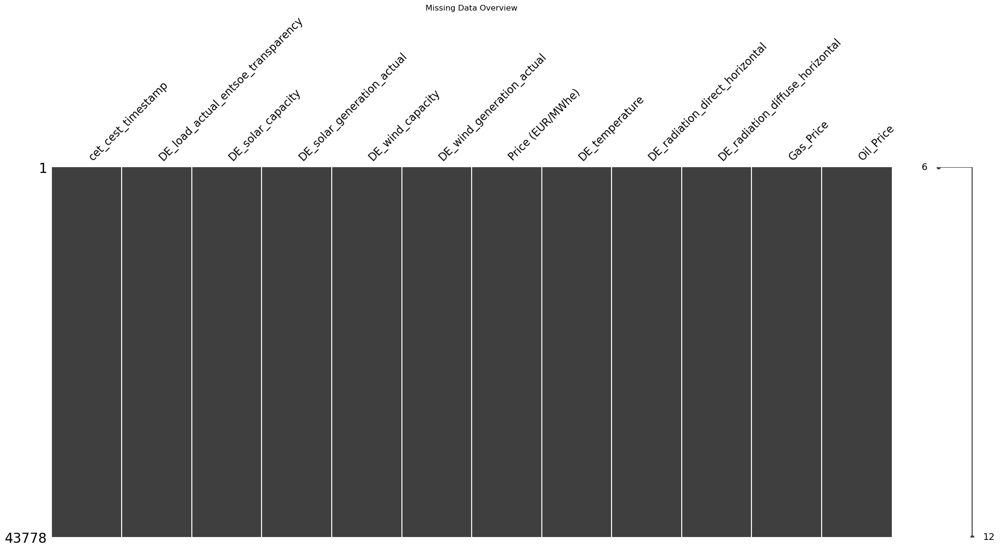

In [4]:
import missingno as msno
msno.matrix(df)
plt.title('Missing Data Overview')
plt.show()

Using Ydata library

In [5]:
from ydata_profiling import ProfileReport

# Generate report (use your actual DataFrame)
profile = ProfileReport(df, title="Data Profiling Report")

# To display in notebook
profile.to_notebook_iframe()

# To save as HTML
profile.to_file("report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 12/12 [00:07<00:00,  1.57it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 📊 Time Series Plots

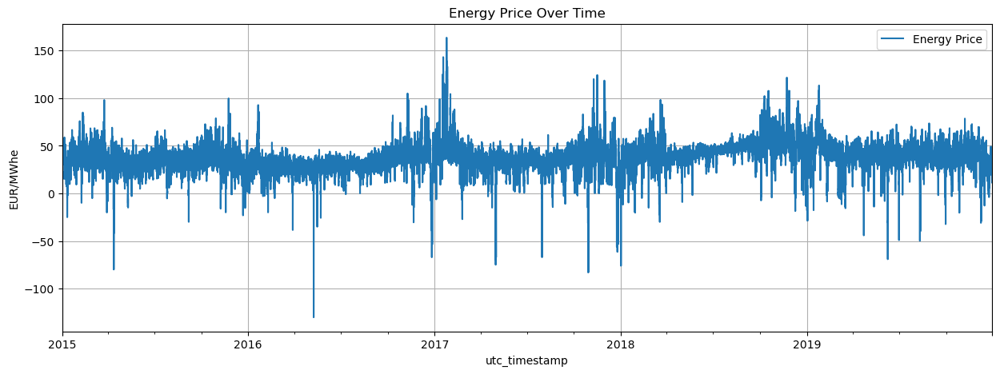

In [6]:
fig, ax = plt.subplots(figsize=(15, 5))
df['Price (EUR/MWhe)'].plot(ax=ax, label='Energy Price')
ax.set_title('Energy Price Over Time')
ax.set_ylabel('EUR/MWhe')
plt.legend()
plt.grid(True)
plt.show()

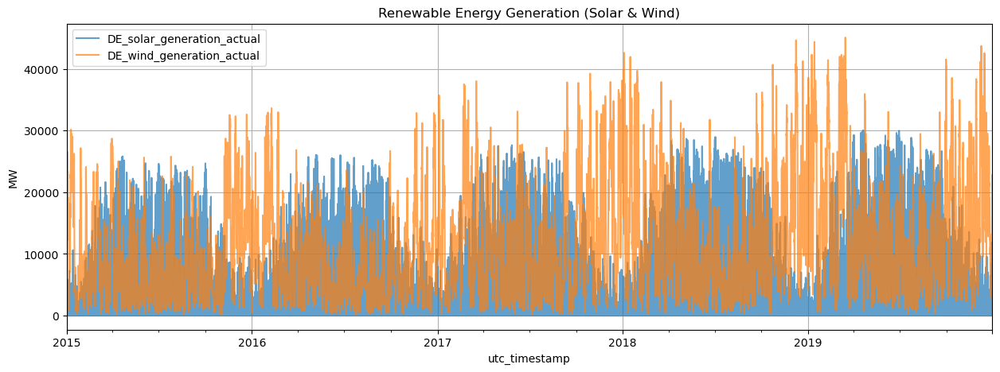

In [7]:
# Plot solar and wind generation
df[['DE_solar_generation_actual', 'DE_wind_generation_actual']].plot(figsize=(15, 5), alpha=0.7)
plt.title('Renewable Energy Generation (Solar & Wind)')
plt.ylabel('MW')
plt.grid(True)
plt.show()

## 📌 Correlation Matrix

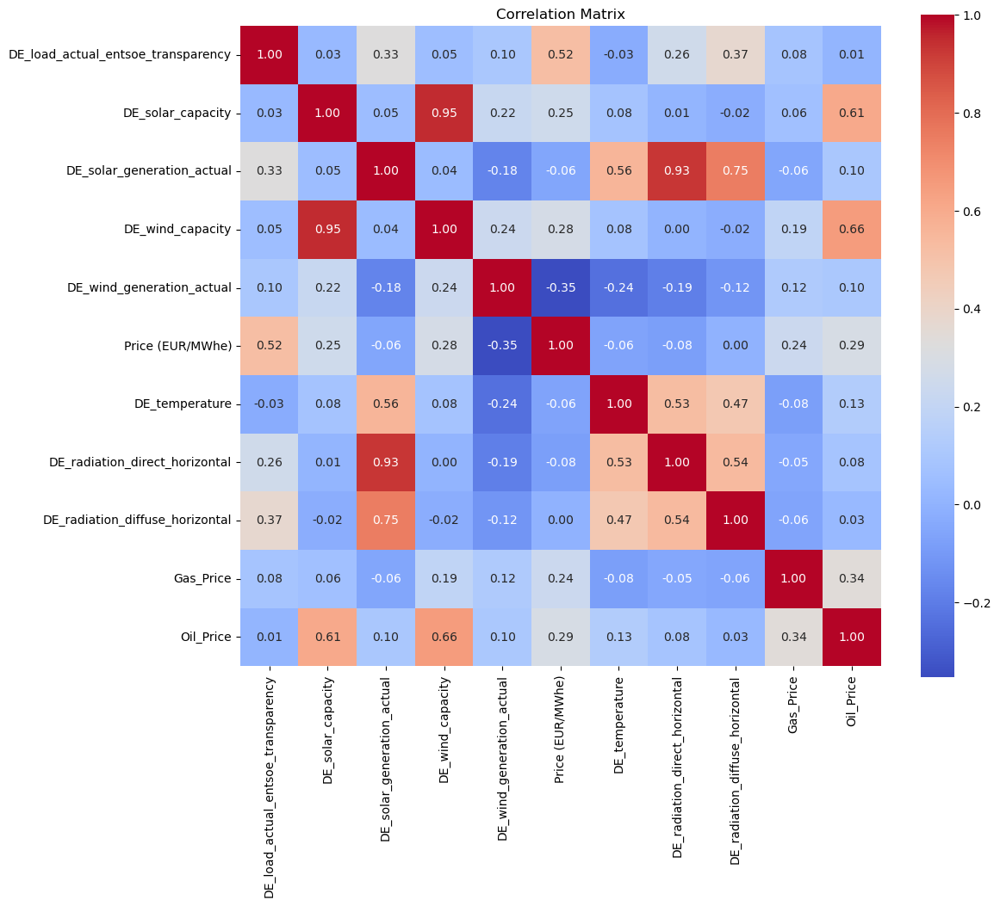

In [8]:
# Compute correlations
corr = df.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Correlation Matrix')
plt.show()

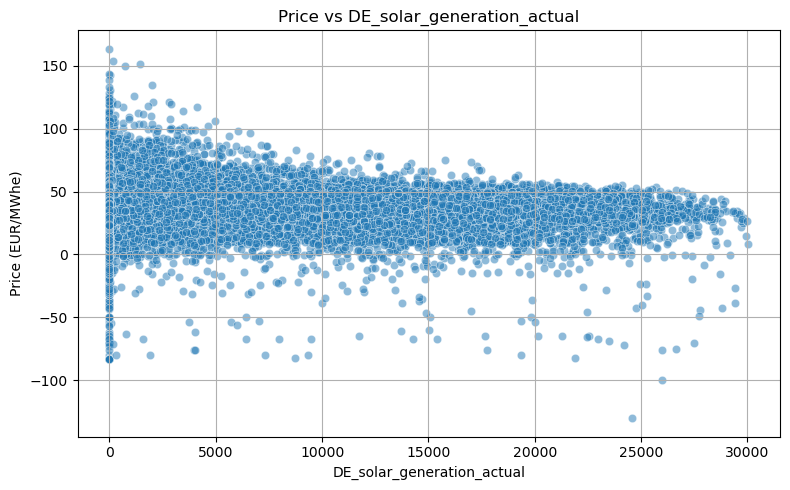

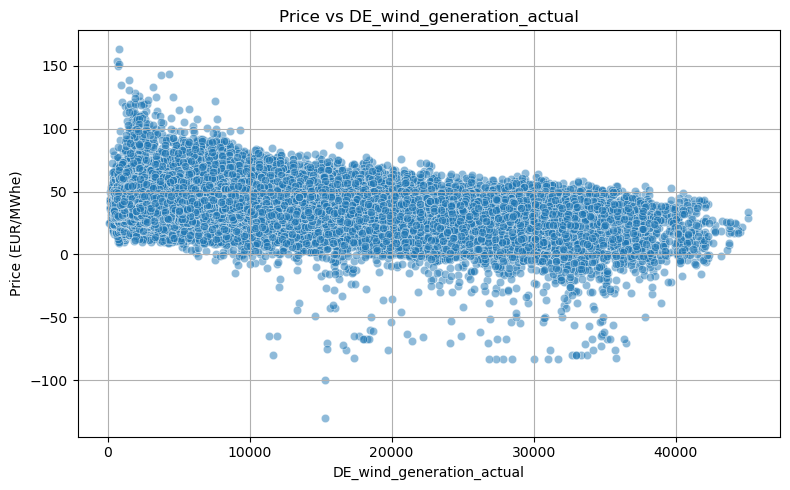

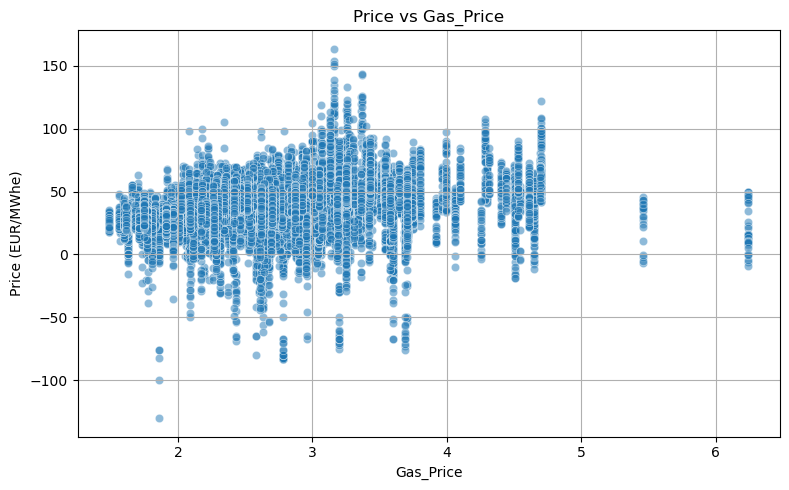

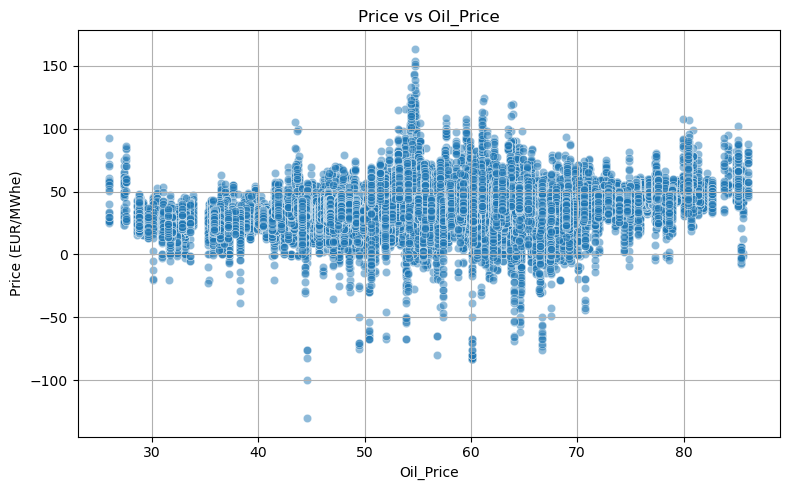

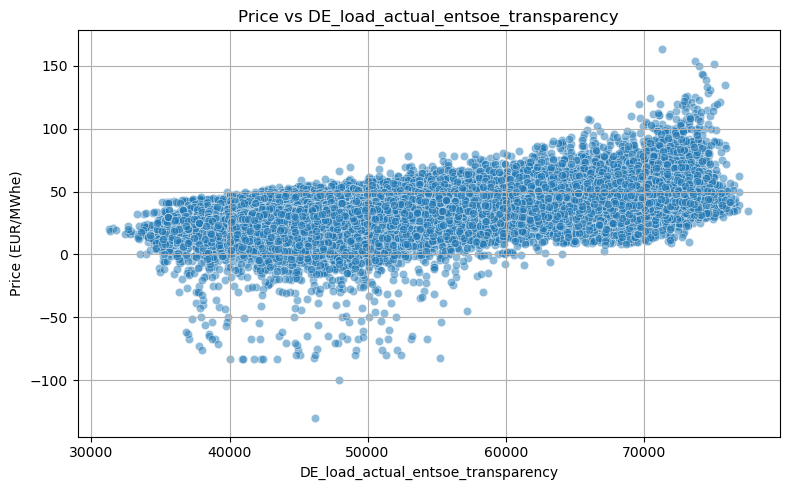

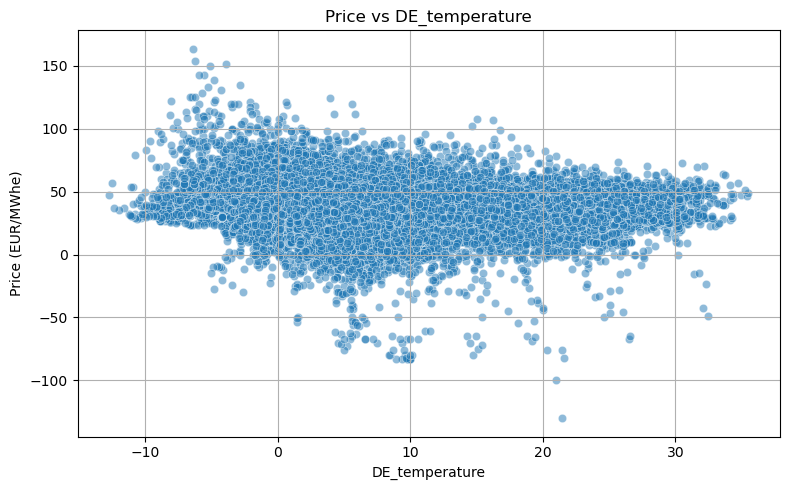

In [10]:
features = [
    'DE_solar_generation_actual',
    'DE_wind_generation_actual',
    'Gas_Price',
    'Oil_Price',
    'DE_load_actual_entsoe_transparency',
    'DE_temperature'
]

for feature in features:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(data=df, x=feature, y='Price (EUR/MWhe)', alpha=0.5)
    plt.title(f'Price vs {feature}')
    plt.xlabel(feature)
    plt.ylabel('Price (EUR/MWhe)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [11]:
df['price_roll_24h'] = df['Price (EUR/MWhe)'].rolling(window=24).mean()
df['price_roll_168h'] = df['Price (EUR/MWhe)'].rolling(window=168).mean()

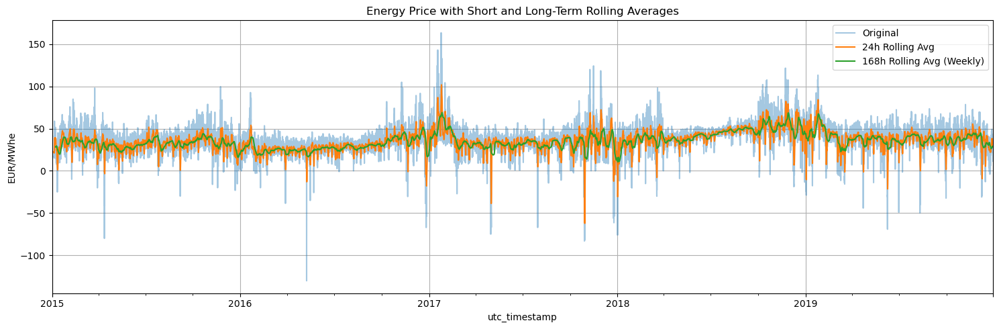

In [12]:
plt.figure(figsize=(15, 5))
df['Price (EUR/MWhe)'].plot(label='Original', alpha=0.4)
df['price_roll_24h'].plot(label='24h Rolling Avg')
df['price_roll_168h'].plot(label='168h Rolling Avg (Weekly)')
plt.title('Energy Price with Short and Long-Term Rolling Averages')
plt.ylabel('EUR/MWhe')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

There seem to be some notable points where energy prices peak and dip significantly

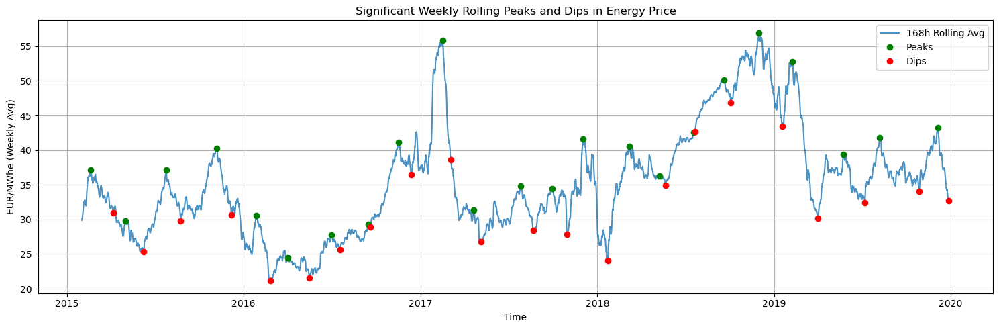

🔼 Top 10 Weekly Price Peaks (Rolling Average):


,Price (EUR/MWhe)
utc_timestamp,
2018-11-30 21:00:00,56.937685
2017-02-15 14:00:00,55.891575
2019-02-08 16:00:00,52.773356
2018-09-19 18:00:00,50.179329
2019-12-05 16:00:00,43.240795
2018-07-19 22:00:00,42.578836
2019-08-07 22:00:00,41.803904
2017-12-02 22:00:00,41.600452
2016-11-16 13:00:00,41.133562


🔽 Top 10 Weekly Price Dips (Rolling Average):


,Price (EUR/MWhe)
utc_timestamp,
2016-02-25 04:00:00,21.149274
2016-05-16 07:00:00,21.561904
2018-01-22 05:00:00,24.105767
2015-06-08 04:00:00,25.301644
2016-07-18 04:00:00,25.652014
2017-05-05 04:00:00,26.801301
2017-10-30 06:00:00,27.904534
2017-08-21 07:00:00,28.420466
2016-09-19 03:00:00,28.959781


In [21]:
from scipy.signal import find_peaks

# Step 1: Compute 168-hour (weekly) rolling average of the price
df['price_roll_168h'] = df['Price (EUR/MWhe)'].rolling(window=730).mean()

# Step 2: Drop NaNs from the rolling column (beginning of the series)
smoothed_price = df['price_roll_168h'].dropna()

# Step 3: Find peaks and dips on the smoothed series
peaks, _ = find_peaks(smoothed_price, distance=1460)
dips, _ = find_peaks(-smoothed_price, distance=1460)

# Step 4: Plot smoothed price with peaks/dips
plt.figure(figsize=(15, 5))
plt.plot(smoothed_price, label='168h Rolling Avg', alpha=0.8)
plt.plot(smoothed_price.iloc[peaks], 'go', label='Peaks')
plt.plot(smoothed_price.iloc[dips], 'ro', label='Dips')
plt.title('Significant Weekly Rolling Peaks and Dips in Energy Price')
plt.xlabel('Time')
plt.ylabel('EUR/MWhe (Weekly Avg)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 5: Extract top 10 peaks and dips from rolling avg
peaks_df = smoothed_price.iloc[peaks].sort_values(ascending=False).head(10)
dips_df = smoothed_price.iloc[dips].sort_values(ascending=True).head(10)

print("🔼 Top 10 Weekly Price Peaks (Rolling Average):")
display(peaks_df.to_frame(name='Price (EUR/MWhe)'))

print("🔽 Top 10 Weekly Price Dips (Rolling Average):")
display(dips_df.to_frame(name='Price (EUR/MWhe)'))


In [22]:
# Required columns to extract for alignment
context_cols = [
    'DE_solar_generation_actual',
    'DE_wind_generation_actual',
    'DE_load_actual_entsoe_transparency',
    'Gas_Price',
    'Oil_Price'
]

# Extract top 10 peaks and dips in rolling average
top_peaks = smoothed_price.iloc[peaks].sort_values(ascending=False).head(10)
top_dips = smoothed_price.iloc[dips].sort_values(ascending=True).head(10)

# Align peaks and dips with context features
peaks_context = df.loc[top_peaks.index, context_cols]
dips_context = df.loc[top_dips.index, context_cols]

# Combine with price values
peaks_context.insert(0, 'Price (EUR/MWhe)', top_peaks)
dips_context.insert(0, 'Price (EUR/MWhe)', top_dips)

# Display
print("🔼 Top 10 Peaks - Aligned Context")
display(peaks_context)

print("🔽 Top 10 Dips - Aligned Context")
display(dips_context)


🔼 Top 10 Peaks - Aligned Context


,Price (EUR/MWhe),DE_solar_generation_actual,DE_wind_generation_actual,DE_load_actual_entsoe_transparency,Gas_Price,Oil_Price
utc_timestamp,,,,,,
2018-11-30 21:00:00,56.937685,0.0,15788.0,59862.0,4.61,57.71
2017-02-15 14:00:00,55.891575,10070.0,1035.0,67236.0,2.95,54.57
2019-02-08 16:00:00,52.773356,19.0,33877.0,70281.0,2.66,61.37
2018-09-19 18:00:00,50.179329,0.0,15676.0,64685.0,3.11,79.43
2019-12-05 16:00:00,43.240795,0.0,23447.0,74882.0,2.42,65.67
2018-07-19 22:00:00,42.578836,0.0,5346.0,46125.0,2.75,71.94
2019-08-07 22:00:00,41.803904,0.0,9105.0,44400.0,2.18,55.03
2017-12-02 22:00:00,41.600452,0.0,9540.0,51050.0,2.84,64.57
2016-11-16 13:00:00,41.133562,1375.0,19311.0,71294.0,2.49,45.07


🔽 Top 10 Dips - Aligned Context


,Price (EUR/MWhe),DE_solar_generation_actual,DE_wind_generation_actual,DE_load_actual_entsoe_transparency,Gas_Price,Oil_Price
utc_timestamp,,,,,,
2016-02-25 04:00:00,21.149274,0.0,5086.0,54069.0,1.78,32.83
2016-05-16 07:00:00,21.561904,8235.0,10930.0,45131.0,1.91,48.49
2018-01-22 05:00:00,24.105767,0.0,17669.0,60764.0,3.13,69.32
2015-06-08 04:00:00,25.301644,1586.0,5304.0,52181.0,2.60,61.33
2016-07-18 04:00:00,25.652014,1149.0,3903.0,52064.0,2.83,45.35
2017-05-05 04:00:00,26.801301,220.0,9868.0,57992.0,3.10,47.45
2017-10-30 06:00:00,27.904534,700.0,19810.0,56451.0,2.94,60.65
2017-08-21 07:00:00,28.420466,11669.0,9455.0,63400.0,3.00,51.94
2016-09-19 03:00:00,28.959781,0.0,2916.0,42433.0,3.00,46.04


Now we did all the neede EDA for the data collected </br>
Finished by Jad Akra on Friday 19th of April 2025